<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Project Title: WorkPlace Safety CV Project (YOLOV11)</p></b></h1
    
### Table of contents:

* [Dowenloading Dataset](#1)
* [IMPORTING LIBRARIES](#2)
* [Loading Model YOLOV11](#3)
* [Training Model in Custom Dataset](#4)
* [Evaluation](#5)
* [Show Results](#6)
* [Test Model](#7)
* [Like this? Upvote and comment! 🌊 End](#8)
    

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Dowenloading Dataset</p></b></h1>

In [1]:
!pip install roboflow
!pip install ultralytics
from roboflow import Roboflow
rf = Roboflow(api_key="EJVfU57oVVqyNxwLK3Tx")
project = rf.workspace("computer-vision").project("worker-safety")
version = project.version(1)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.8/882.8 kB 13.2 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Worker-Safety-1 in yolov11:: 100%|██████████| 6412/6412 [00:01<00:00, 5452.50it/s]


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">IMPORTING LIBRARIES</p></b></h1>

In [2]:
import os
import pandas as pd
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import wandb
wandb.init(mode="disabled")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Loading Model YOLOV9</p></b></h1>

In [3]:
model = YOLO('yolo11s.pt')
model.info()

100%|██████████| 18.4M/18.4M [00:00<00:00, 135MB/s] 


YOLO11s summary: 319 layers, 9,458,752 parameters, 0 gradients, 21.7 GFLOPs


(319, 9458752, 0, 21.718374400000002)

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Training Model in Custom Dataset</p></b></h1>

In [4]:
# Train the model using your dataset
results = model.train(
    data='/kaggle/input/dataset/data.yaml',  # Path to the dataset configuration file
    epochs=50,         # Number of training epochs
    imgsz=640,         # Image size for training
    batch=16,          # Batch size
    workers=4          # Number of data loading workers
)

Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/kaggle/input/dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 13.8MB/s]
2024-10-05 20:01:13,857	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-05 20:01:14,387	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 63.0MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Worker-Safety-1/train/labels... 2991 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2991/2991 [00:02<00:00, 1101.72it/s]


train: New cache created: /kaggle/working/Worker-Safety-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Worker-Safety-1/valid/labels... 119 images, 0 backgrounds, 0 corrupt: 100%|██████████| 119/119 [00:00<00:00, 1246.15it/s]

val: New cache created: /kaggle/working/Worker-Safety-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.84G      1.839      2.113      1.894        168        640: 100%|██████████| 187/187 [01:05<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        119        715      0.529      0.471      0.408      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.82G        1.8      1.745      1.853        196        640: 100%|██████████| 187/187 [01:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        119        715      0.665       0.36      0.363      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.56G      1.779      1.713      1.853        190        640: 100%|██████████| 187/187 [01:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all        119        715       0.64      0.432       0.44      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.87G      1.766      1.658      1.843        158        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]

                   all        119        715      0.577      0.386      0.381       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       4.9G      1.727      1.586      1.802        153        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

                   all        119        715      0.511      0.445       0.48      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.88G      1.715       1.54      1.779        218        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        119        715      0.651      0.503      0.512      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.78G       1.68      1.478      1.753         96        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.89it/s]

                   all        119        715      0.763      0.518        0.6      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       4.7G      1.651       1.44      1.735        183        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.78it/s]

                   all        119        715      0.581      0.523        0.6      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.61G      1.649      1.392      1.712        154        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.98it/s]


                   all        119        715      0.793      0.548      0.657      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.89G      1.621      1.352      1.712        217        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        119        715      0.656      0.595      0.645      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.74G      1.601      1.337      1.695        163        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]

                   all        119        715      0.779      0.577      0.608      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.77G      1.602      1.296      1.678        205        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.95it/s]


                   all        119        715      0.623      0.644      0.655      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.59G      1.575       1.27      1.679        172        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        119        715      0.822      0.588      0.672      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       4.9G      1.562       1.24      1.652        182        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.88it/s]

                   all        119        715      0.842      0.609      0.684       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.73G      1.554      1.224      1.648        177        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]

                   all        119        715       0.58      0.652       0.65      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.62G      1.537      1.196      1.632        207        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]

                   all        119        715      0.717      0.694      0.707      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.75G      1.527      1.169      1.622        153        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.95it/s]

                   all        119        715      0.784      0.637      0.704      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.82G      1.511      1.167      1.619        195        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        119        715      0.846      0.583      0.717       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.68G      1.511       1.14      1.611        166        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        119        715      0.705      0.725      0.738      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       4.7G      1.496      1.126      1.596        168        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        119        715      0.586      0.629      0.673      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.58G      1.496      1.129      1.599        162        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        119        715       0.69      0.712      0.745      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.75G      1.494      1.099      1.591        212        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.92it/s]


                   all        119        715      0.615      0.739      0.696      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.82G      1.467      1.084      1.573        198        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        119        715      0.773      0.642      0.736      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.74G      1.458      1.072      1.562        243        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.93it/s]


                   all        119        715      0.825      0.652       0.71      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.87G      1.442      1.048      1.552        162        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]


                   all        119        715      0.827      0.657      0.748      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.84G      1.429      1.024      1.546        126        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.93it/s]

                   all        119        715      0.612      0.713      0.715      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.69G      1.421      1.019      1.543        149        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.84it/s]

                   all        119        715      0.794      0.698      0.761      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.88G      1.421      1.015      1.534        172        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]

                   all        119        715      0.645      0.746      0.739      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.76G       1.41      1.006      1.532        154        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]

                   all        119        715       0.81       0.72      0.787      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.87G      1.398     0.9908      1.521        174        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.94it/s]

                   all        119        715      0.754      0.735      0.774      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.87G      1.384     0.9889      1.522        164        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.95it/s]

                   all        119        715      0.703      0.745       0.77      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.81G      1.373     0.9582      1.502        175        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.99it/s]


                   all        119        715       0.71      0.776      0.774      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.53G      1.363     0.9469      1.499        152        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        119        715      0.734      0.785      0.775      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.53G      1.348     0.9361      1.484        216        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]

                   all        119        715      0.865      0.741      0.825      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.86G      1.337     0.9297      1.486        195        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        119        715      0.758      0.719      0.748      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       4.7G      1.343     0.9225      1.481        131        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.00it/s]


                   all        119        715      0.787      0.757        0.8      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.86G      1.322      0.904      1.475        138        640: 100%|██████████| 187/187 [01:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        119        715      0.735      0.768      0.772      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.87G      1.315     0.8851       1.46        194        640: 100%|██████████| 187/187 [01:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.81it/s]

                   all        119        715       0.84      0.782      0.812      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.89G      1.301     0.8805       1.45        112        640: 100%|██████████| 187/187 [01:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        119        715      0.804       0.74      0.802      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.76G      1.281      0.864      1.441        118        640: 100%|██████████| 187/187 [01:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.85it/s]

                   all        119        715      0.807      0.802      0.828      0.394


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.82G      1.289     0.7378      1.488         88        640: 100%|██████████| 187/187 [01:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.94it/s]


                   all        119        715      0.744      0.755      0.778      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.58G      1.262     0.6994      1.463         71        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.93it/s]


                   all        119        715      0.781      0.758      0.797      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.85G      1.244      0.684      1.453        121        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]


                   all        119        715      0.769      0.778      0.778       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.92G       1.22     0.6718      1.435         94        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.83it/s]

                   all        119        715       0.81      0.771      0.794       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.62G      1.207     0.6643      1.431         69        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.93it/s]

                   all        119        715      0.787      0.756      0.791      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.57G       1.19     0.6534      1.413         99        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        119        715      0.788      0.758      0.794      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.79G      1.176     0.6437      1.397         87        640: 100%|██████████| 187/187 [01:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        119        715      0.822      0.766      0.797      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.53G      1.156     0.6252      1.392         93        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]


                   all        119        715      0.789      0.796      0.799      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.78G      1.153     0.6232      1.388        118        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.99it/s]

                   all        119        715      0.789       0.79      0.795      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       4.9G      1.137     0.6191      1.376         87        640: 100%|██████████| 187/187 [01:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.92it/s]

                   all        119        715      0.807      0.793      0.803      0.397



50 epochs completed in 0.891 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 238 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]


                   all        119        715      0.789      0.796      0.802      0.399
                helmet        117        232      0.903      0.888      0.927      0.493
             no-helmet          6         11      0.643      0.545      0.495      0.186
               no-vest         52         90      0.693        0.8      0.772      0.324
                person        115        241      0.827      0.938      0.919      0.534
                  vest         74        141      0.877      0.807      0.896      0.458
Speed: 0.2ms preprocess, 5.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/train


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Evaluation</p></b></h1>

In [5]:
evaluation = model.val(data='/kaggle/input/dataset/data.yaml')

Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 238 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /kaggle/working/Worker-Safety-1/valid/labels.cache... 119 images, 0 backgrounds, 0 corrupt: 100%|██████████| 119/119 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.15it/s]


                   all        119        715      0.789      0.796      0.799      0.398
                helmet        117        232      0.903      0.888      0.927      0.493
             no-helmet          6         11      0.642      0.545      0.482      0.181
               no-vest         52         90      0.694        0.8      0.772      0.324
                person        115        241       0.83      0.938      0.919      0.534
                  vest         74        141      0.877      0.807      0.896       0.46
Speed: 0.2ms preprocess, 7.0ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/train2


<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Show Results</p></b></h1>

In [6]:
def Show_Result(image_path):
    img = mpimg.imread(image_path)
    plt.style.use('dark_background')
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [7]:
path = os.path.join('/kaggle/working/runs/detect',os.listdir('/kaggle/working/runs/detect')[-1])
path

'/kaggle/working/runs/detect/train2'

In [8]:
pd.read_csv('/kaggle/working/runs/detect/train/results.csv')

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.8394,2.11280,1.8935,0.52876,0.47132,0.40764,0.14254,2.2264,1.70610,2.3292,0.000368,0.000368,0.000368
1,2,1.7995,1.74480,1.8530,0.66530,0.35982,0.36346,0.11666,2.3653,1.90150,2.4811,0.000724,0.000724,0.000724
2,3,1.7786,1.71280,1.8532,0.64013,0.43232,0.43983,0.15649,2.0975,1.88480,2.1640,0.001065,0.001065,0.001065
3,4,1.7659,1.65830,1.8429,0.57674,0.38568,0.38112,0.13980,2.0984,1.91450,2.1222,0.001045,0.001045,0.001045
4,5,1.7274,1.58640,1.8019,0.51075,0.44531,0.47975,0.17896,2.1460,1.47650,2.1171,0.001023,0.001023,0.001023
5,6,1.7145,1.53980,1.7791,0.65131,0.50313,0.51160,0.17117,2.2252,1.44280,2.2422,0.001001,0.001001,0.001001
6,7,1.6805,1.47760,1.7528,0.76255,0.51828,0.60010,0.22345,2.0718,1.31630,2.0891,0.000979,0.000979,0.000979
7,8,1.6509,1.43950,1.7346,0.58081,0.52339,0.60049,0.22744,2.1404,1.26090,2.1313,0.000957,0.000957,0.000957
8,9,1.6486,1.39210,1.7124,0.79253,0.54791,0.65698,0.24158,2.1685,1.16060,2.1266,0.000935,0.000935,0.000935
9,10,1.6215,1.35200,1.7123,0.65575,0.59532,0.64477,0.25093,2.0599,1.25020,2.0610,0.000913,0.000913,0.000913


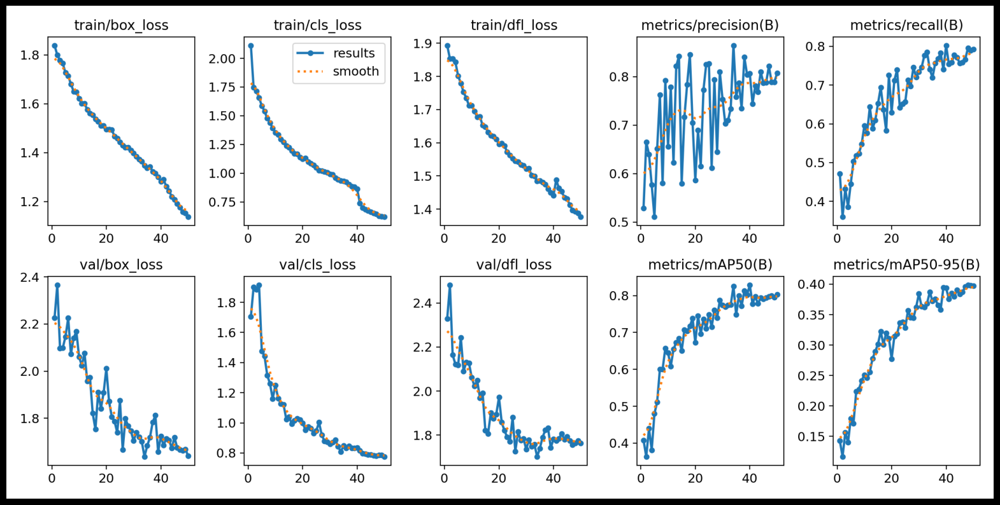

In [9]:
### Results
Show_Result('/kaggle/working/runs/detect/train/results.png')

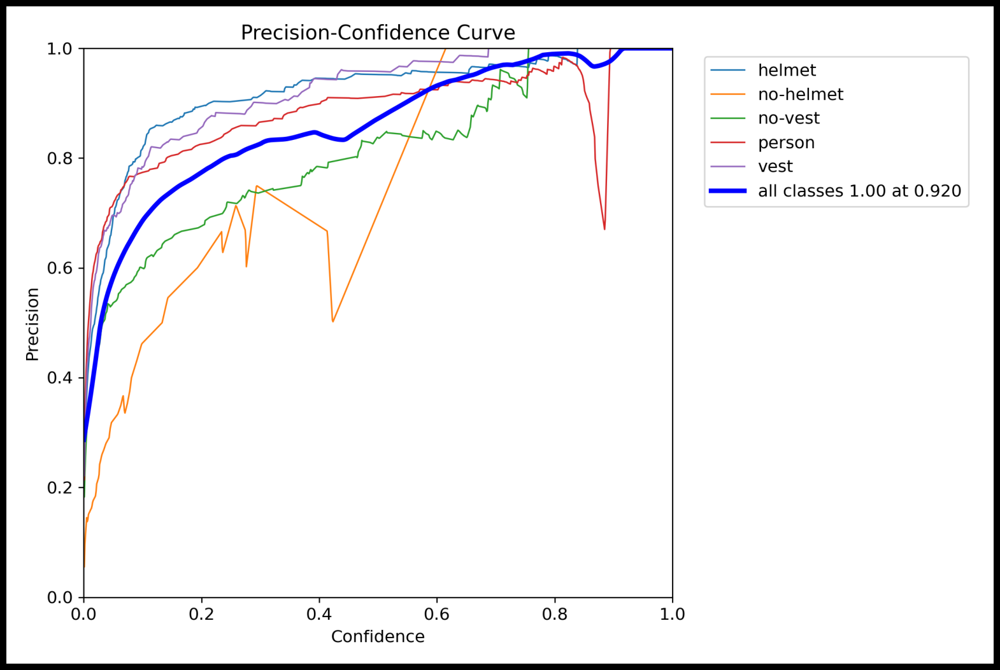

In [10]:
## Precision
Show_Result(os.path.join(path,'P_curve.png'))

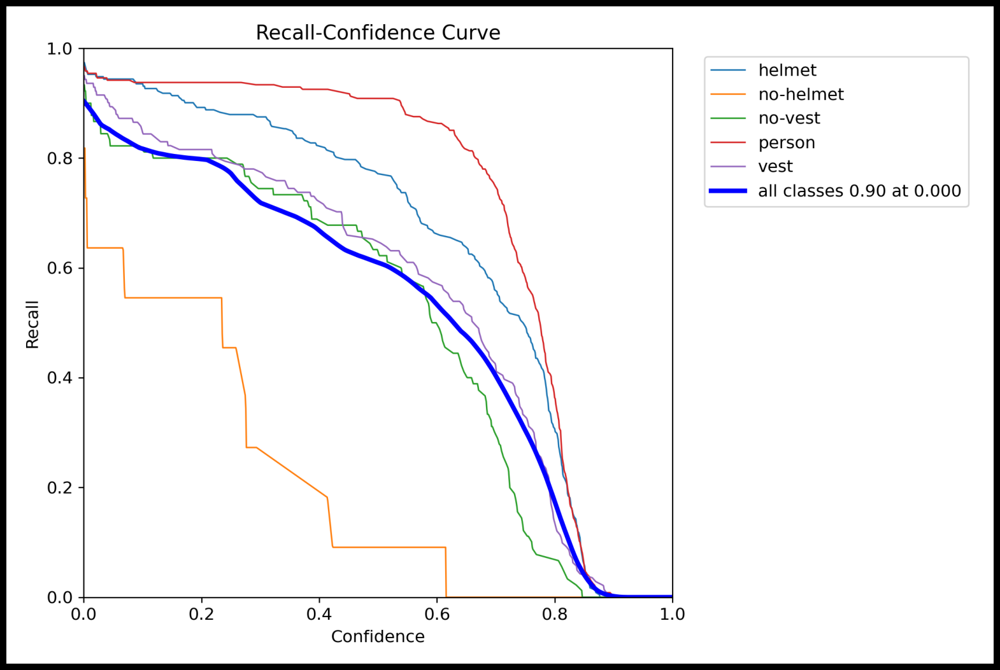

In [11]:
## Recall
Show_Result(os.path.join(path,'R_curve.png'))

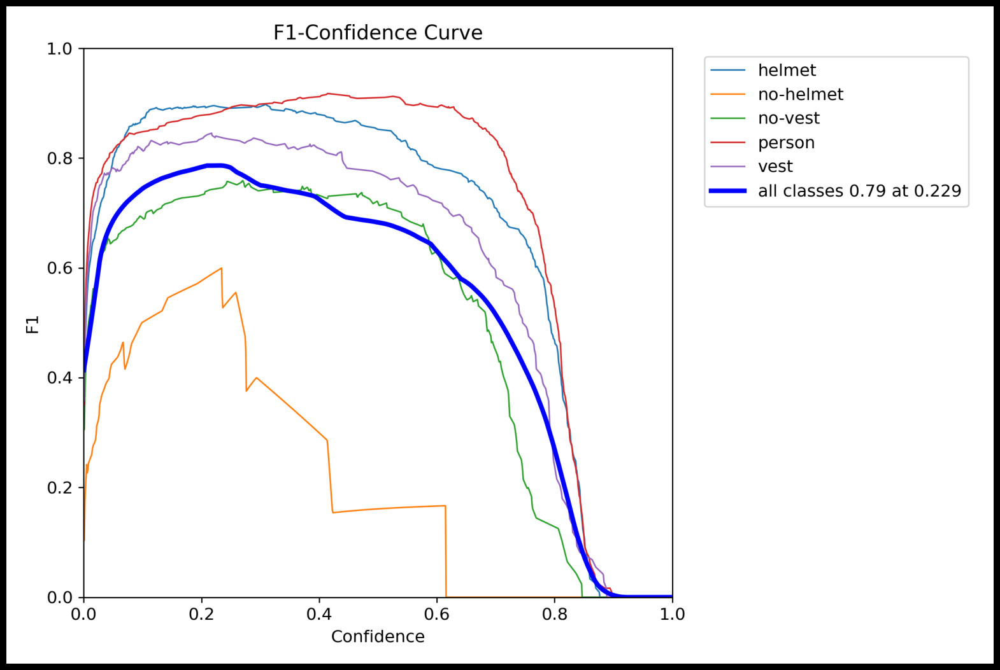

In [12]:
## F1
Show_Result(os.path.join(path,'F1_curve.png'))

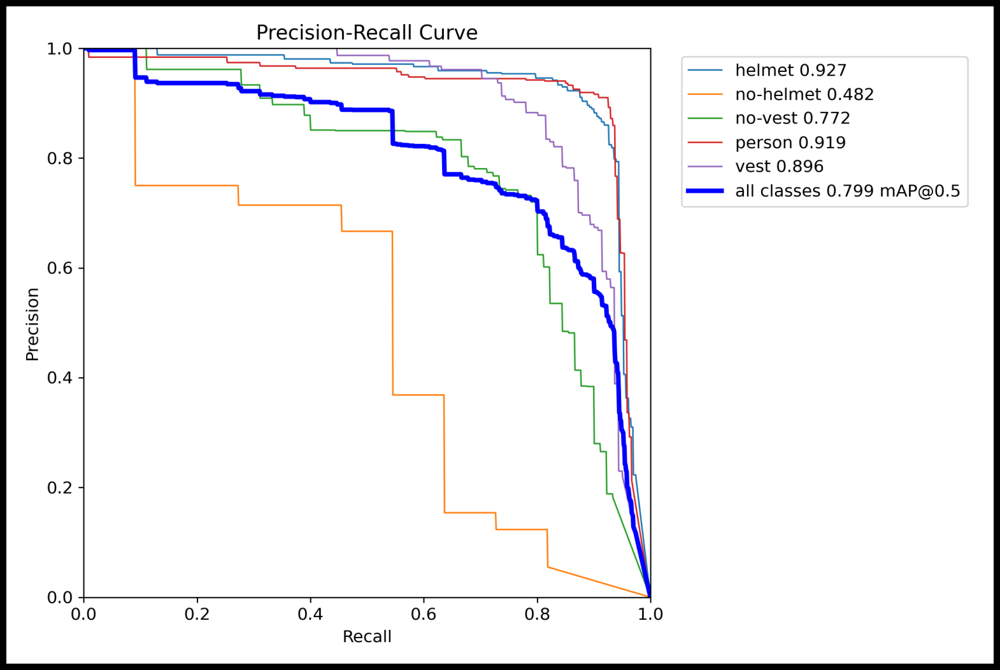

In [13]:
## Precision-Recall
Show_Result(os.path.join(path,'PR_curve.png'))

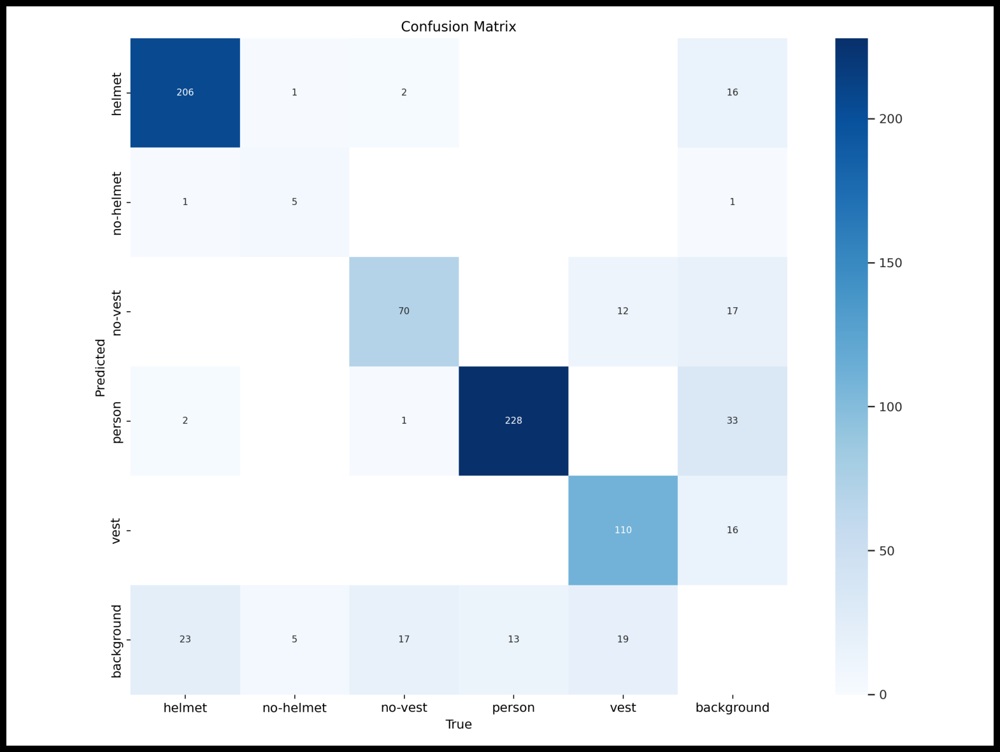

In [14]:
## Confusion Matrix
Show_Result(os.path.join(path,'confusion_matrix.png'))

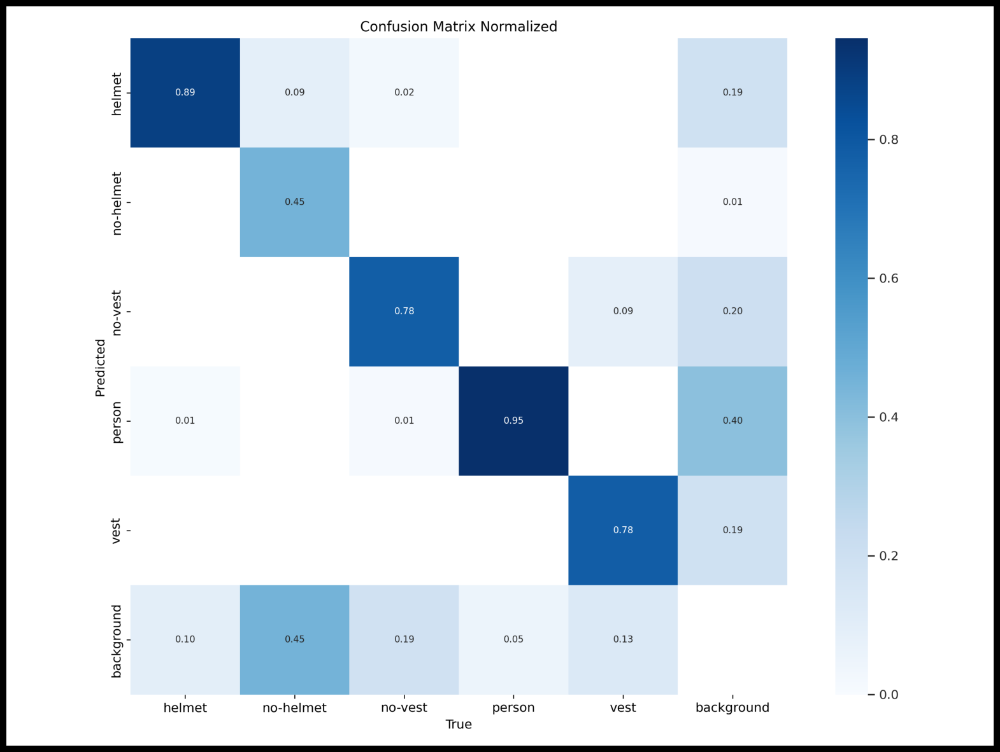

In [15]:
## Confusion Matrix Normalized
Show_Result(os.path.join(path,'confusion_matrix_normalized.png'))

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Test Model</p></b></h1>

In [16]:
# Run inference on images in the 'test' folder
results = model.predict(source='/kaggle/working/Worker-Safety-1/test/images', imgsz=640, conf=0.5,verbose=False)

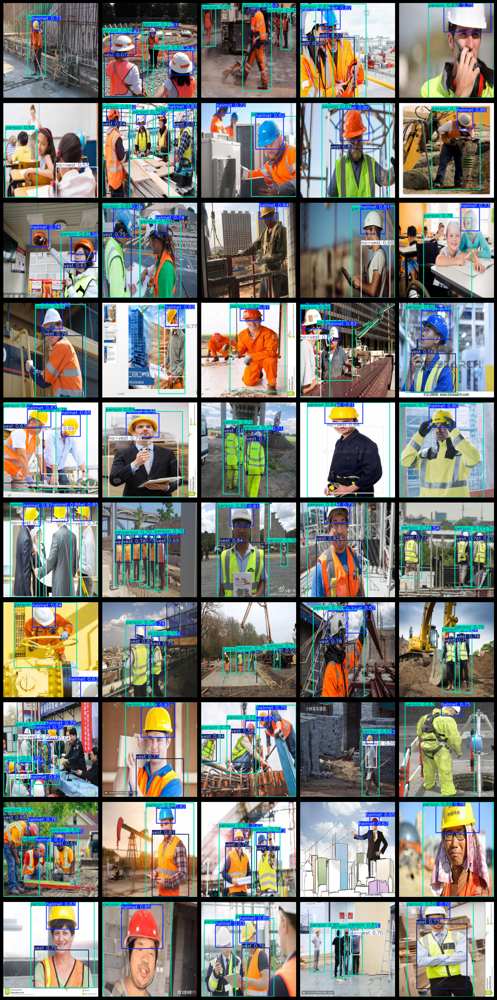

In [17]:
# Number of images to display
num_images = 50

# Set up the figure and grid
fig, axes = plt.subplots(10, 5, figsize=(15, 30))  # 10 rows and 5 columns

# Ensure there are enough images in the results
for i in range(min(num_images, len(results))):
    # Get the image with boxes drawn
    img_with_boxes = results[i].plot()  # This draws bounding boxes and labels on the image

    # Convert the image to RGB (matplotlib expects RGB, OpenCV uses BGR)
    img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

    # Get the appropriate axis in the grid
    ax = axes[i // 5, i % 5]  # 5 columns
    ax.imshow(img_with_boxes)
    ax.axis('off')  # Hide the axes

# Adjust layout
plt.tight_layout()
plt.show()

<h1><b><p style="background-image: url(https://i.postimg.cc/0Qwf8YX6/2927262.jpg);font-family:camtasia;font-size:110%;color:white;text-align:center;border-radius:15px 50px; padding:7px; border:solid 2px #09375b; box-shadow: 10px 10px 10px #042b4c">Like this? Upvote and comment! 🌊 End</p></b></h1>